Read in Floooding.csv file

In [4]:
import geopandas as gpd
flooding = gpd.read_file("Flooding.csv")
flooding = flooding.drop([2669, 4050, 4199, 4200, 4202, 4230])
flooding

/anaconda/envs/gdal/lib/python3.8/site-packages/geopandas/geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


,Service Request (SR) Number,SR Description,Method Received,SR Status,Status Change Date,Created Date,Last Update Date,Close Date,SR Location,Street Number,...,County,State Plane X Coordinate,State Plane Y Coordinate,Latitude Coordinate,Longitude Coordinate,(Latitude.Longitude),Council District,Map Page,Map Tile,geometry
0,20-00186472,Flooding Current (Non-Emergency),Phone,Closed,11/23/2020 0:02,5/12/2020 10:18,11/23/2020 0:02,11/23/2020 0:02,"5800 S CONGRESS AVE, AUSTIN, TX 78745",5800,...,TRAVIS,3104425.247,10046906,30.2031419,-97.77585598,"(30.2031419, -97.77585598)",2,644T,MG16,None
1,20-00193993,Flooding - Past,Spot311 Interface,Closed,11/23/2020 0:05,5/17/2020 7:34,11/23/2020 0:05,11/23/2020 0:05,"4341 MOUNT BONNELL RD, AUSTIN, TX 78731",4341,...,TRAVIS,3103742.099,10092011.47,30.32717381,-97.77473415,"(30.32717381, -97.77473415)",10,554B,MG27,None
2,20-00193995,Flooding - Past,Spot311 Interface,Closed,11/23/2020 0:05,5/17/2020 7:37,11/23/2020 0:05,11/23/2020 0:05,"4369 MOUNT BONNELL RD, AUSTIN, TX 78731",4369,...,TRAVIS,3103598.836,10092248.4,30.32783416,-97.77517085,"(30.32783416, -97.77517085)",10,554B,MG27,None
3,20-00301254,Flooding - Past,Phone,Closed,8/11/2020 9:09,7/24/2020 9:14,8/11/2020 9:09,8/11/2020 9:09,"8012 BESTRIDE BND, AUSTIN, TX 78744",8012,...,TRAVIS,3122140.365,10028569.07,30.15160514,-97.72115654,"(30.15160514, -97.72115654)",2,705C,MK12,None
4,19-00294289,Flooding - Past,Phone,Closed,2/19/2020 0:04,8/2/2019 18:02,2/19/2020 0:04,2/19/2020 0:04,"2005 RIVERVIEW ST, AUSTIN, TX 78702",2005,...,TRAVIS,3119827.226,10064667.4,30.25098211,-97.72579607,"(30.25098211, -97.72579607)",3,615G,MK21,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5238,21-00357376,Flooding Current (Non-Emergency),Spot311 Interface,Closed,8/3/2021 12:03,8/2/2021 13:35,8/3/2021 12:03,8/3/2021 12:03,"5309 GUADALUPE ST, AUSTIN, TX 78751",5309,...,TRAVIS,3118980.214,10089888.75,30.32036611,-97.72660628,"(30.32036611, -97.72660628)",9,555G,MK27,None
5239,21-00357949,Flooding - Past,Phone,Open,8/3/2021 11:54,8/2/2021 18:17,8/3/2021 11:54,8/3/2021 13:41,"12404 BLUESTONE CIR, AUSTIN, TX 78758",12404,...,TRAVIS,3132970.865,10121824.72,30.40724339,-97.67986307,"(30.40724339, -97.67986307)",7,466Y,MM34,None
5240,21-00358094,Flooding - Past,Spot311 Interface,Open,8/3/2021 12:01,8/2/2021 21:05,8/3/2021 12:01,8/3/2021 13:41,"1317 BRAIDED ROPE DR, AUSTIN, TX 78727",1317,...,TRAVIS,3132285.248,10124445,30.41449104,-97.68183928,"(30.41449104, -97.68183928)",7,466Q,MM35,None
5241,21-00358373,Flooding - Past,E-Mail,Open,8/3/2021 12:02,8/3/2021 8:17,8/3/2021 12:02,8/3/2021 13:41,"SCRIBE DR & SCOTCH BROOM DR, AUSTIN, TX",,...,TRAVIS,3122198.568,10124731.28,30.415935,-97.71380876,"(30.415935, -97.71380876)",7,465R,MK35,None


Create a dataframe with Latitudes, Longitudes and Dates

In [5]:
allLats = flooding['Latitude Coordinate'].tolist()
allLongs = flooding['Longitude Coordinate'].tolist()
dates2 = flooding['Created Date'].tolist()
#newDates = []
#for date in dates2:
#    newDates.append(date[6:10] + '-' + date[0:2] + '-' + date[3:5])
import pandas as pd
data = {'Latitude': allLats, 'Longitude': allLongs, 'Date': dates2}
df = pd.DataFrame(data=data)
df

,Latitude,Longitude,Date
0,30.2031419,-97.77585598,5/12/2020 10:18
1,30.32717381,-97.77473415,5/17/2020 7:34
2,30.32783416,-97.77517085,5/17/2020 7:37
3,30.15160514,-97.72115654,7/24/2020 9:14
4,30.25098211,-97.72579607,8/2/2019 18:02
...,...,...,...
5232,30.32036611,-97.72660628,8/2/2021 13:35
5233,30.40724339,-97.67986307,8/2/2021 18:17
5234,30.41449104,-97.68183928,8/2/2021 21:05
5235,30.415935,-97.71380876,8/3/2021 8:17


Create distance function

In [6]:
import math
def dist(a,b,c,d):
    return math.sqrt((a-c)**2 + (b-d)**2)

Function to find closest precipitation recording site to a 311 call

In [7]:
import numpy as np
def findClosest(lat, longitude):
    station_id = ['KGTU', 'KATT', 'KRYW', 'KEDC', 'KAUS']
    station_location = [(30.69, -97.69), (30.32, -97.77),(30.50, -97.97),(30.40, -97.57), (30.20, -97.68)]
    distances =[dist((station_location[i][0]), (station_location[i][1]), lat, longitude)for i, station in enumerate(station_id)]
    #print(station_location[i][0])
    closest = station_id[np.argmin(distances)]
    return(closest)

Find closest station to all 311 calls

In [8]:
newStations = []
for i in range(len(allLats)):
    newStations.append(findClosest(float(allLats[i]), float(allLongs[i])))
print(len(newStations))

5237


Function to get precipitation data from a recording site

In [9]:
def getCSVS2(links):
    allDays = []
    allPrecip = []
    for link in links:
        df1 = pd.read_csv(link)
        df1.columns = ['Station', 'Name', 'Latitude', 'Longitude', 'Elevation(ft)', 'Start_Time(UTC)', 'End_Time(UTC)', 'Precip(IN)']
        dates = df1['Start_Time(UTC)'].tolist()
        days = []
        for date in dates:
            days.append(date[0:10])
        precip = df1['Precip(IN)'].tolist()
        allDays.append(days)
        allPrecip.append(precip)
    return(allDays, allPrecip)

Get precipitation data from KATT site

In [11]:
data = getCSVS2(['KATT-copy/TxMeso_Precip_Daily_KATT_01012014_01012015.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012015_01012016.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012016_12312016.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012017_01012018.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012018_01012019.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012019_01012020.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012020_12312020.csv', 'KATT-copy/TxMeso_Precip_Daily_KATT_01012021_08052021.csv'])
dates = data[0]
precip = data[1]
days = dates[0] + dates[1] + dates[2] + dates[3] + dates[4] + dates[5] + dates[6] + dates[7]
KATT_precip = precip[0] + precip[1] + precip[2] + precip[3] + precip[4] + precip[5] + precip[6] + precip[7]
keys = []
KATT = {}
for day in days:
    key = day[0:10] + 'KATT'
    keys.append(key)
for i in range(len(keys)):
    KATT[keys[i]] = KATT_precip[i]
KATT

{'2014-01-01KATT': 0.0,
 '2014-01-02KATT': 0.0,
 '2014-01-03KATT': 0.0,
 '2014-01-04KATT': 0.0,
 '2014-01-05KATT': 0.0,
 '2014-01-06KATT': 0.0,
 '2014-01-07KATT': 0.02,
 '2014-01-08KATT': 0.14,
 '2014-01-09KATT': 0.01,
 '2014-01-10KATT': 0.09,
 '2014-01-11KATT': 0.0,
 '2014-01-12KATT': 0.01,
 '2014-01-13KATT': 0.0,
 '2014-01-14KATT': 0.0,
 '2014-01-15KATT': 0.0,
 '2014-01-16KATT': 0.0,
 '2014-01-17KATT': 0.0,
 '2014-01-18KATT': 0.0,
 '2014-01-19KATT': 0.0,
 '2014-01-20KATT': 0.0,
 '2014-01-21KATT': 0.0,
 '2014-01-22KATT': 0.0,
 '2014-01-23KATT': 0.11,
 '2014-01-24KATT': 0.0,
 '2014-01-25KATT': 0.0,
 '2014-01-26KATT': 0.0,
 '2014-01-27KATT': 0.03,
 '2014-01-28KATT': 0.04,
 '2014-01-29KATT': 0.0,
 '2014-01-30KATT': 0.0,
 '2014-01-31KATT': 0.0,
 '2014-02-01KATT': 0.0,
 '2014-02-02KATT': 0.02,
 '2014-02-03KATT': 0.13,
 '2014-02-04KATT': 0.02,
 '2014-02-05KATT': 0.0,
 '2014-02-06KATT': 0.0,
 '2014-02-07KATT': 0.0,
 '2014-02-08KATT': 0.0,
 '2014-02-09KATT': 0.0,
 '2014-02-10KATT': 0.0,
 '201

Get precipitation from KAUS site

In [12]:
data = getCSVS2(['KAUS-copy/TxMeso_Precip_Daily_KAUS_01012014_01012015.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012015_01012016.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012016_12312016.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012017_01012018.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012018_01012019.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012019_01012020.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012020_12312020.csv', 'KAUS-copy/TxMeso_Precip_Daily_KAUS_01012021_08052021.csv'])
dates = data[0]
precip = data[1]
days = dates[0] + dates[1] + dates[2] + dates[3] + dates[4] + dates[5] + dates[6] + dates[7]
KAUS_precip = precip[0] + precip[1] + precip[2] + precip[3] + precip[4] + precip[5] + precip[6] + precip[7]
keys = []
KAUS = {}
for day in days:
    key = day[0:10] + 'KAUS'
    keys.append(key)
for i in range(len(keys)):
    KAUS[keys[i]] = KAUS_precip[i]
KAUS

{'2014-01-01KAUS': 0.0,
 '2014-01-02KAUS': 0.0,
 '2014-01-03KAUS': 0.0,
 '2014-01-04KAUS': 0.0,
 '2014-01-05KAUS': 0.0,
 '2014-01-06KAUS': 0.0,
 '2014-01-07KAUS': 0.04,
 '2014-01-08KAUS': 0.15,
 '2014-01-09KAUS': 0.05,
 '2014-01-10KAUS': 0.17,
 '2014-01-11KAUS': 0.0,
 '2014-01-12KAUS': 0.0,
 '2014-01-13KAUS': 0.0,
 '2014-01-14KAUS': 0.0,
 '2014-01-15KAUS': 0.0,
 '2014-01-16KAUS': 0.0,
 '2014-01-17KAUS': 0.0,
 '2014-01-18KAUS': 0.0,
 '2014-01-19KAUS': 0.0,
 '2014-01-20KAUS': 0.0,
 '2014-01-21KAUS': 0.0,
 '2014-01-22KAUS': 0.0,
 '2014-01-23KAUS': 0.11,
 '2014-01-24KAUS': 0.0,
 '2014-01-25KAUS': 0.0,
 '2014-01-26KAUS': 0.0,
 '2014-01-27KAUS': 0.01,
 '2014-01-28KAUS': 0.04,
 '2014-01-29KAUS': 0.0,
 '2014-01-30KAUS': 0.0,
 '2014-01-31KAUS': 0.0,
 '2014-02-01KAUS': 0.0,
 '2014-02-02KAUS': 0.06,
 '2014-02-03KAUS': 0.11,
 '2014-02-04KAUS': 0.04,
 '2014-02-05KAUS': 0.0,
 '2014-02-06KAUS': 0.0,
 '2014-02-07KAUS': 0.0,
 '2014-02-08KAUS': 0.0,
 '2014-02-09KAUS': 0.0,
 '2014-02-10KAUS': 0.0,
 '2014

Get precipitation data from the KEDC site

In [13]:
data = getCSVS2(['KEDC-copy/TxMeso_Precip_Daily_KEDC_01012014_01012015.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012015_01012016.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012016_12312016.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012017_01012018.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012018_01012019.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012019_01012020.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012020_12312020.csv', 'KEDC-copy/TxMeso_Precip_Daily_KEDC_01012021_08052021.csv'])
dates = data[0]
precip = data[1]
days = dates[0] + dates[1] + dates[2] + dates[3] + dates[4] + dates[5] + dates[6] + dates[7]
KEDC_precip = precip[0] + precip[1] + precip[2] + precip[3] + precip[4] + precip[5] + precip[6] + precip[7]
keys = []
KEDC = {}
for day in days:
    key = day[0:10] + 'KEDC'
    keys.append(key)
for i in range(len(keys)):
    KEDC[keys[i]] = KEDC_precip[i]
KEDC

{'2014-01-01KEDC': 0.0,
 '2014-01-02KEDC': 0.0,
 '2014-01-03KEDC': 0.0,
 '2014-01-04KEDC': 0.0,
 '2014-01-05KEDC': 0.0,
 '2014-01-06KEDC': 0.0,
 '2014-01-07KEDC': 0.01,
 '2014-01-08KEDC': 0.14,
 '2014-01-09KEDC': 0.07,
 '2014-01-10KEDC': 0.16,
 '2014-01-11KEDC': 0.0,
 '2014-01-12KEDC': 0.0,
 '2014-01-13KEDC': 0.0,
 '2014-01-14KEDC': 0.0,
 '2014-01-15KEDC': 0.0,
 '2014-01-16KEDC': 0.0,
 '2014-01-17KEDC': 0.0,
 '2014-01-18KEDC': 0.0,
 '2014-01-19KEDC': 0.0,
 '2014-01-20KEDC': 0.0,
 '2014-01-21KEDC': 0.0,
 '2014-01-22KEDC': 0.0,
 '2014-01-23KEDC': 0.01,
 '2014-01-24KEDC': 0.0,
 '2014-01-25KEDC': 0.0,
 '2014-01-26KEDC': 0.0,
 '2014-01-27KEDC': 0.0,
 '2014-01-28KEDC': 0.0,
 '2014-01-29KEDC': 0.0,
 '2014-01-30KEDC': 0.0,
 '2014-01-31KEDC': 0.0,
 '2014-02-01KEDC': 0.0,
 '2014-02-02KEDC': 0.02,
 '2014-02-03KEDC': 0.05,
 '2014-02-04KEDC': 0.04,
 '2014-02-05KEDC': 0.0,
 '2014-02-06KEDC': 0.0,
 '2014-02-07KEDC': 0.0,
 '2014-02-08KEDC': 0.0,
 '2014-02-09KEDC': 0.0,
 '2014-02-10KEDC': 0.0,
 '2014-0

Change dates from string to datetime object then back to desired string

In [14]:
import datetime
from datetime import datetime
newDates = []
for date in dates2:
    dtObject = datetime.strptime(date, "%m/%d/%Y %H:%M")
    newDates.append(dtObject.strftime("%Y-%m-%d"))

Find amount of precipitation that corresponds to each 311 call

In [15]:
all_precip2 = {}
place = all_precip2.update(KATT)
place = all_precip2.update(KAUS)
place = all_precip2.update(KEDC)
newKeys = []
for i in range(len(newDates)):
    newKeys.append(newDates[i] + newStations[i])
def getPrecip4():
    newRain2 = []
    for key in newKeys:
        newRain2.append(all_precip2.get(key, 0))
    return(newRain2)
newRain2 = getPrecip4()
newRain2

[2.71,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.3,
 3.3,
 0.02,
 0.0,
 3.38,
 3.3,
 3.38,
 3.38,
 3.38,
 3.3,
 3.38,
 3.38,
 3.38,
 3.38,
 3.38,
 3.38,
 3.38,
 3.3,
 3.38,
 3.38,
 3.3,
 0.001,
 0.0,
 0.0,
 3.38,
 1.3,
 0.34,
 1.57,
 1.3,
 0.23,
 1.11,
 0.0,
 0.77,
 0.002,
 0.08,
 0.0,
 0.0,
 0.16,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.09,
 0.01,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.14,
 0.0,
 2.09,
 0.0,
 0.0,
 0.05,
 0.02,
 2.17,
 2.09,
 2.09,
 2.17,
 2.09,
 0.04,
 0.0,
 0.002,
 0.0,
 0.0,
 0.0,
 0.562,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.013,
 0.012,
 0.01,
 2.71,
 2.37,
 2.71,
 1.45,
 2.37,
 2.37,
 0.0,
 0.01,
 0.0,
 0.0,
 0.0,
 0.0,
 0.02,
 0.0,
 3.3,
 1.3,
 1.57,
 1.3,
 1.3,
 0.0,
 0.0,
 0.0,
 2.344,
 0.0,
 0.0,
 0.06,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.04,
 0.0,
 0.0,
 0.02,
 2.37,
 2.37,
 0.04,
 0.04,
 1.84,
 1.11,
 1.44,
 1.44,
 0.01,
 0.01,
 0.0,
 0.11,
 0.0,
 0.14,
 0.0,
 0.0,
 0.46,
 0.46,
 0.46,
 0.39,
 0.0,
 1.04,
 0.39,
 0.0,
 2.344,
 0.0,
 1.258

Import package to transfrom coordinates

In [16]:
from pyproj import Proj, transform

Function to convert Latitudes and Longitudes to EPSG 5070

In [17]:
def convert(lat, lon):
    inProj = Proj(init='epsg:4326')
    outProj = Proj(init='epsg:5070')
    x1,y1 = lat, lon
    x2,y2 = transform(inProj,outProj,x1,y1)
    return (x2,y2)

Convert coordinates

In [18]:
conversions = []
for i in range(len(allLats)):
    conversions.append(convert(allLongs[i], allLats[i]))

/anaconda/envs/gdal/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/anaconda/envs/gdal/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/anaconda/envs/gdal/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making th

Split tuples resulting from conversions

In [20]:
firsts = []
seconds = []
for conversion in conversions:
    firsts.append(conversion[0])
    seconds.append(conversion[1])

New Dataframe with EPSG 5070 coordinates and precipitation

In [21]:
allData = {'Longitudes': firsts, 'Latitudes': seconds, 'Precipitation Day Of': newRain2}
df = pd.DataFrame(data=allData)
df

,Longitudes,Latitudes,Precipitation Day Of
0,-170730.618338,793518.027604,2.710
1,-170365.601232,807285.688822,0.000
2,-170406.147631,807359.791939,0.000
3,-165576.018316,787700.844489,0.000
4,-165821.947833,798740.055933,0.000
...,...,...,...
5232,-165759.816487,806444.704640,0.642
5233,-161102.244421,816011.389999,0.080
5234,-161277.501362,816819.624092,0.080
5235,-164339.946148,817034.752330,0.000


Plot all 311 calls

<AxesSubplot:>

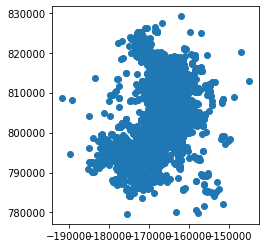

In [22]:
import geopandas
gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitudes, df.Latitudes))
gdf.plot()

Plot city of Austin

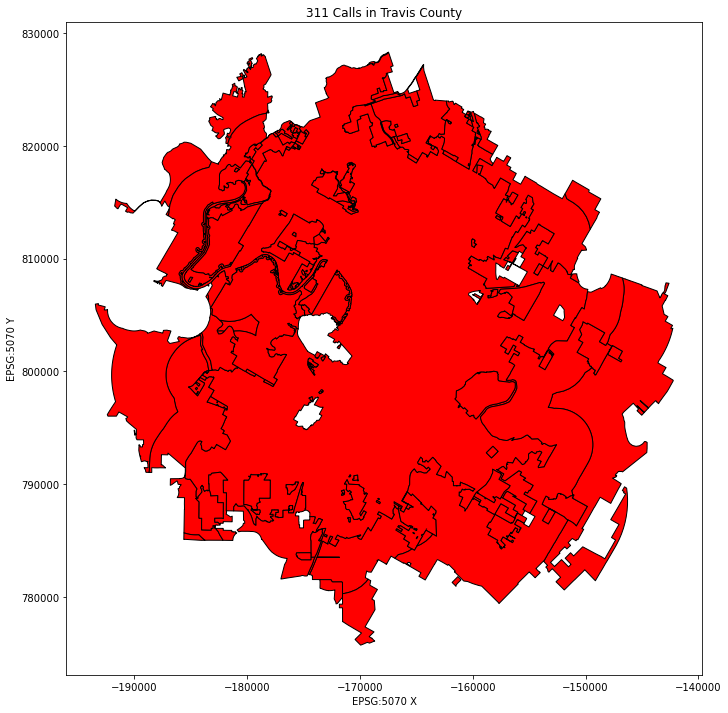

In [24]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import geopandas as gpd
city = gpd.read_file('Austin-copy/austin.shp')
city.crs
city = city.to_crs("EPSG:5070")
ax = city.plot(color='red', edgecolor='black', figsize=(12, 12))
#gdf.plot(ax=ax, color='red')
plt.title('311 Calls in Travis County')
plt.xlabel('EPSG:5070 X')
plt.ylabel('EPSG:5070 Y')
plt.show()

Plot Mopac

In [25]:
roads = gpd.read_file('Roadways-copy/TxDOT_Roadways.shp')
mopac = roads[roads.GID == 1599257390]
mopac.crs
mopac = mopac.to_crs("EPSG:5070")

Plot I-35

In [27]:
I35 = roads[roads.GID == 1585769215]
I35.crs
I35 = I35.to_crs("EPSG:5070")

Plot Highway 130

In [28]:
H130 = roads[roads.GID == 9003]
H130.crs
H130 = H130.to_crs("EPSG:5070")

Function to plot 311 calls on a map containing the city of Austin and its highways

In [29]:
def highwayPlot(gdf, variable, label, title):
   ax = city.plot(color='grey', edgecolor='grey', figsize=(12, 12))
   ax2 = mopac.plot(ax=ax, color = 'red')
   ax3 = I35.plot(ax=ax2, color = 'orange')
   ax4 = H130.plot(ax=ax3, color = 'yellow')
   gdf.plot(variable, ax=ax4, legend = True, legend_kwds= {'label': label}, cmap = 'viridis')
   plt.title(title)
   plt.xlabel('EPSG:5070 X')
   plt.ylabel('EPSG:5070 Y')
   plt.ylim(770000, 830000)
   plt.show() 

Plot calls with color corresponding to precipitation day of

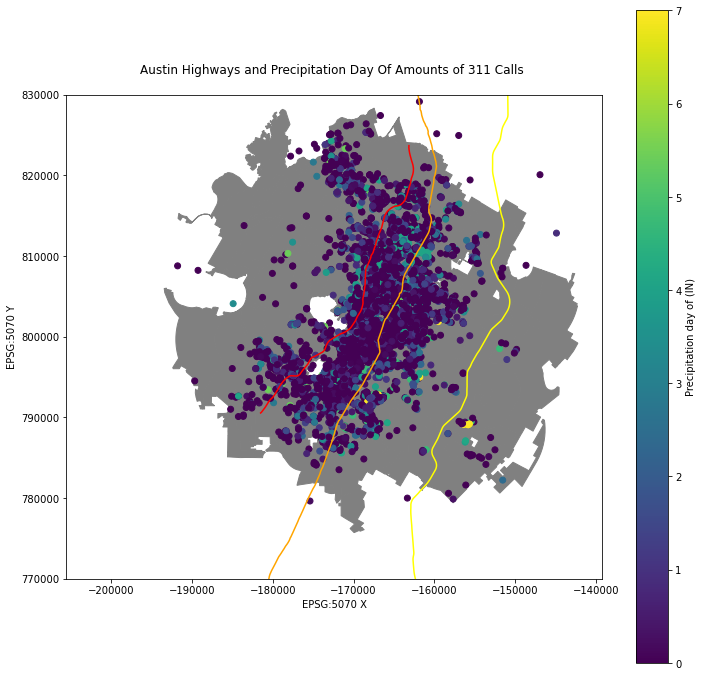

In [30]:
highwayPlot(gdf, "Precipitation Day Of",  "Precipitation day of (IN)", 'Austin Highways and Precipitation Day Of Amounts of 311 Calls \n')

Bar graph showing distribution of precipitation day of each call

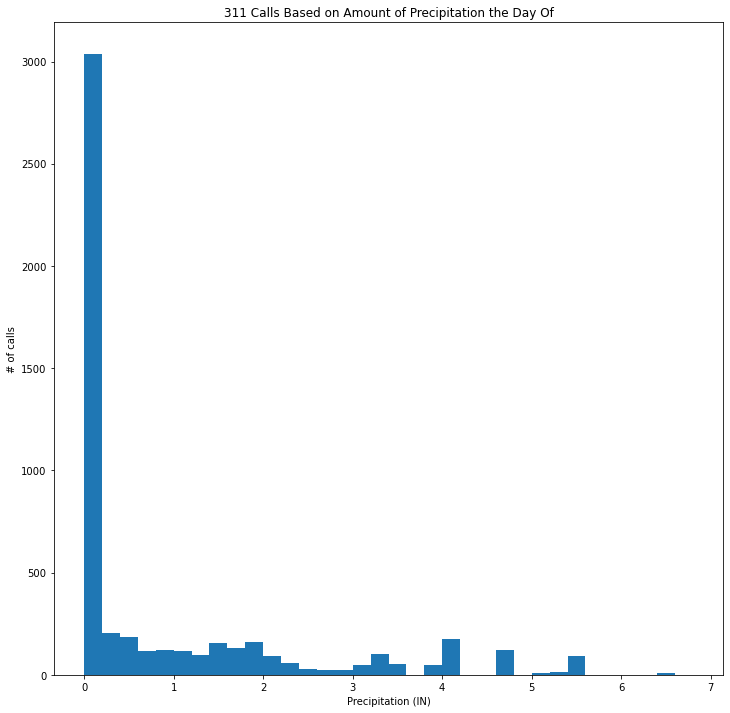

In [32]:
fig, ax = plt.subplots(figsize =(12, 12))
bins = []
for i in range(35):
    bins.append(i/5)
ax.hist(newRain2, bins = bins)
plt.title('311 Calls Based on Amount of Precipitation the Day Of')
plt.xlabel('Precipitation (IN)')
plt.ylabel('# of calls')
plt.show()

Dataframe only containing calls with precipitation associated

In [33]:
allData = {'Longitudes': firsts, 'Latitudes': seconds, 'precip': newRain2}
df = pd.DataFrame(data=allData)
df = df.loc[df.precip>0]
df

,Longitudes,Latitudes,precip
0,-170730.618338,793518.027604,2.710
7,-161200.373957,815784.480930,3.300
8,-160255.711743,813295.699927,3.300
9,-169951.178918,797120.864010,0.020
11,-167336.614631,803618.676942,3.380
...,...,...,...
5228,-157155.636805,815599.119913,0.080
5230,-171491.267430,795780.008456,0.064
5232,-165759.816487,806444.704640,0.642
5233,-161102.244421,816011.389999,0.080


Plot above dataframe

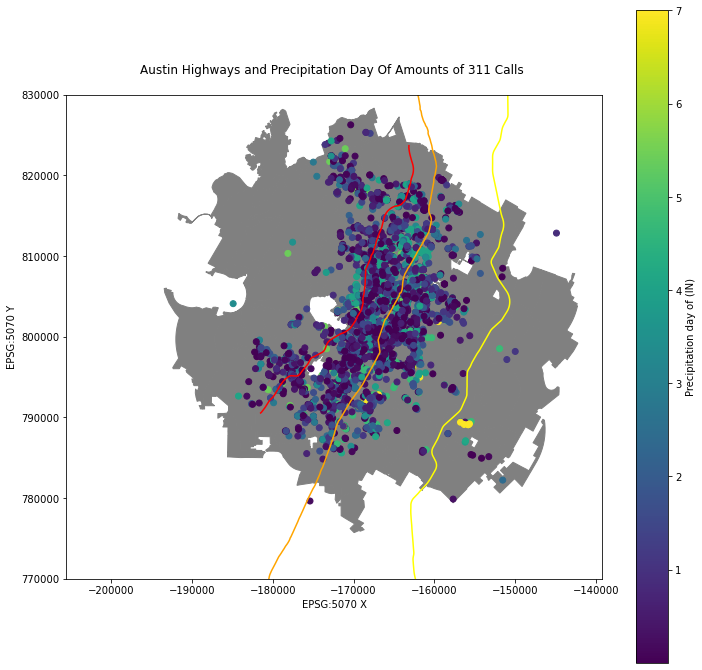

In [34]:
gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitudes, df.Latitudes))
highwayPlot(gdf, "precip", "Precipitation day of (IN)", 'Austin Highways and Precipitation Day Of Amounts of 311 Calls \n')

Dataframe containing only calls with more then 1 inch of precipitation associated

In [35]:
allData = {'Longitudes': firsts, 'Latitudes': seconds, 'precip': newRain2}
df = pd.DataFrame(data=allData)
df = df.loc[df.precip>=1]
df

,Longitudes,Latitudes,precip
0,-170730.618338,793518.027604,2.710
7,-161200.373957,815784.480930,3.300
8,-160255.711743,813295.699927,3.300
11,-167336.614631,803618.676942,3.380
12,-159761.409077,813813.966750,3.300
...,...,...,...
5128,-168089.943566,813096.204930,1.446
5136,-170035.494030,802881.961864,2.370
5172,-167704.436122,791535.962753,1.394
5198,-167988.302317,792329.931205,1.133


Plot above dataframe

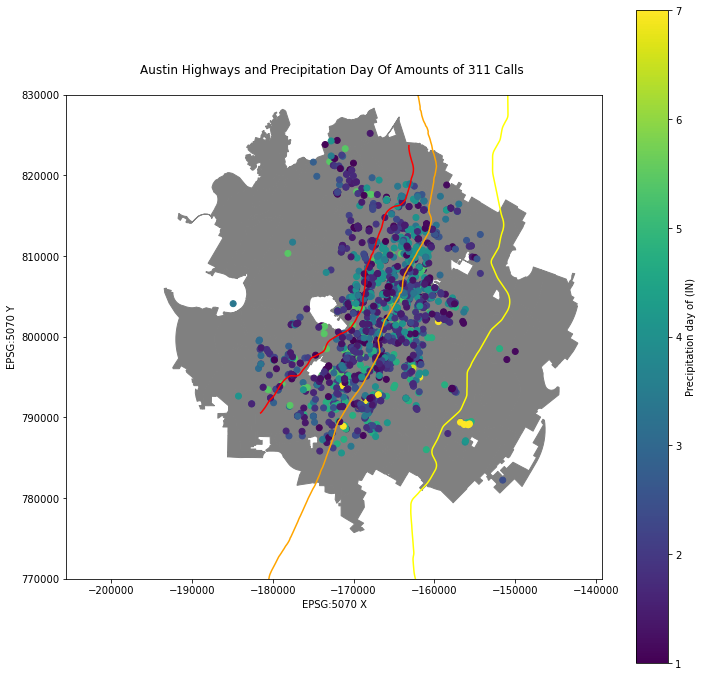

In [36]:
#Make your map into a funciton. THis will save your memory as all the extra variables will be removed after the funciton call. 
gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitudes, df.Latitudes))
highwayPlot(gdf, "precip", "Precipitation day of (IN)", 'Austin Highways and Precipitation Day Of Amounts of 311 Calls \n')

Create arrays for final dataframe

In [37]:
dates2 = flooding['Created Date'].tolist()
allDates2 = []
years = []
flooded = []
for date in dates2:
    now = datetime.strptime(date, '%m/%d/%Y %H:%M')
    year = now.strftime('%Y')
    years.append(int(year))
    allDates2.append(now)
    flooded.append('Flooded')
print(years)
len(allDates2)

[2020, 2020, 2020, 2020, 2019, 2020, 2020, 2019, 2019, 2020, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2019, 2019, 2019, 2020, 2019, 2019, 2019, 2020, 2020, 2020, 2019, 2019, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2019, 2019, 2020, 2019, 2019, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2019, 2019, 2020, 2020, 2019, 2020, 2019, 2019, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2019, 2020, 2020, 2020, 2020, 2020, 2019, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2020, 2020, 2019, 2020, 2020, 2020, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 2020, 2020, 2020, 2020, 2020, 2019, 2019, 2020, 2020, 2019, 2019, 2019, 2019, 2019, 2019, 2019, 201

5237

Create confirmed floods csv to export

In [42]:
data = {'X': firsts, 'Y': seconds, 'Precip': newRain2, 'Date': allDates2, 'Flooded/Dry': flooded, 'year_of_loss': years}
df = pd.DataFrame(data=data)
df
df.to_csv('confirmed_floods.csv')